In [1]:
import boto3
import io
import pandas as pd
import numpy as np
from PIL.Image import Image
import matplotlib.pyplot as plt
from utils.plot import plot_image, load_tiny_batch, plot_images_grid, draw_boxes

%config InlineBackend.figure_format = 'retina'

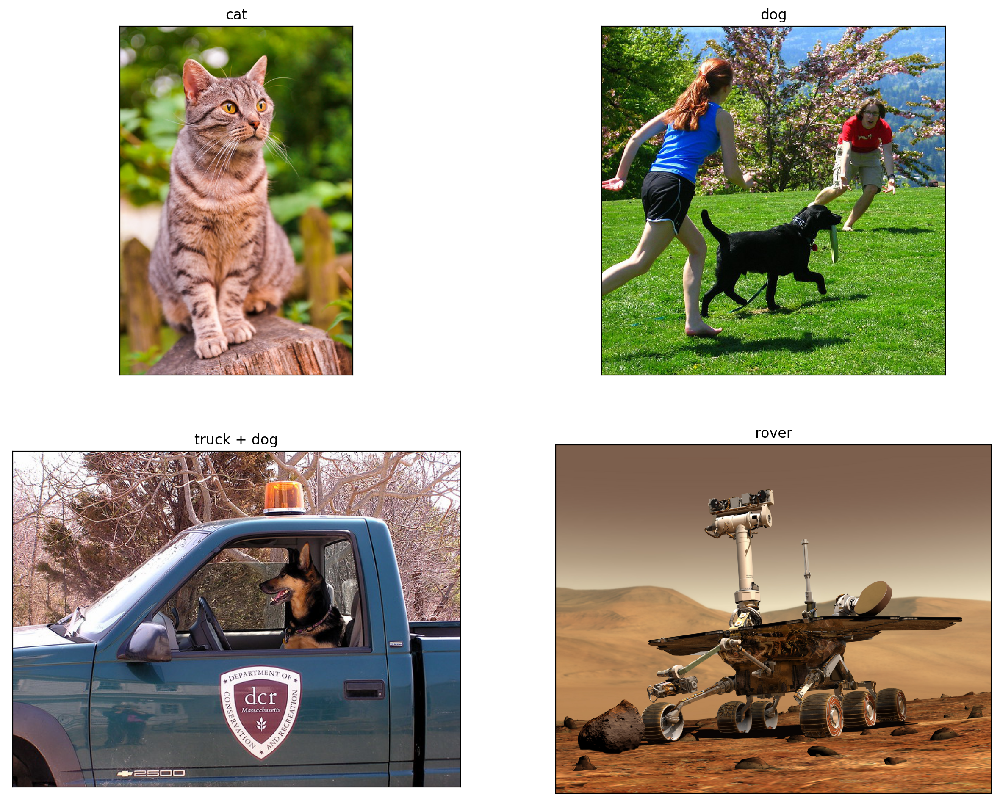

In [2]:
# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [18]:
def detect_objects(image: Image):
    image_bytes = io.BytesIO()
    image.save(image_bytes, format='PNG')
    image_bytes = image_bytes.getvalue()

    client = boto3.client('rekognition')
    response = client.detect_labels(
        Image={
            'Bytes': image_bytes
        }
    )
    
    summary = pd.DataFrame([
        {
            'Name': r['Name'], 
            'Confidence': r['Confidence'], 
            'Instances': len(r['Instances'])
        } 
        for r in response['Labels']
    ])
    
    boxes = []
    class_names = []
    scores = []
    for label in response['Labels']:
        for instance in label['Instances']:
            class_names.append(label['Name'])
            scores.append(instance['Confidence'] / 100)
            boxes.append((
                instance['BoundingBox']['Top'],
                instance['BoundingBox']['Left'],
                (instance['BoundingBox']['Top'] + instance['BoundingBox']['Height']),
                (instance['BoundingBox']['Left'] + instance['BoundingBox']['Width'])
            ))
            
    image = draw_boxes(np.array(image), np.array(boxes), class_names, scores)
    return image, summary

,Name,Confidence,Instances
0,Pet,97.989342,0
1,Abyssinian,97.989342,0
2,Cat,97.989342,1
3,Animal,97.989342,0
4,Mammal,97.989342,0
5,Manx,87.329247,0
6,Wildlife,60.686924,0
7,Leopard,60.686924,0
8,Jaguar,60.686924,0
9,Panther,60.686924,1


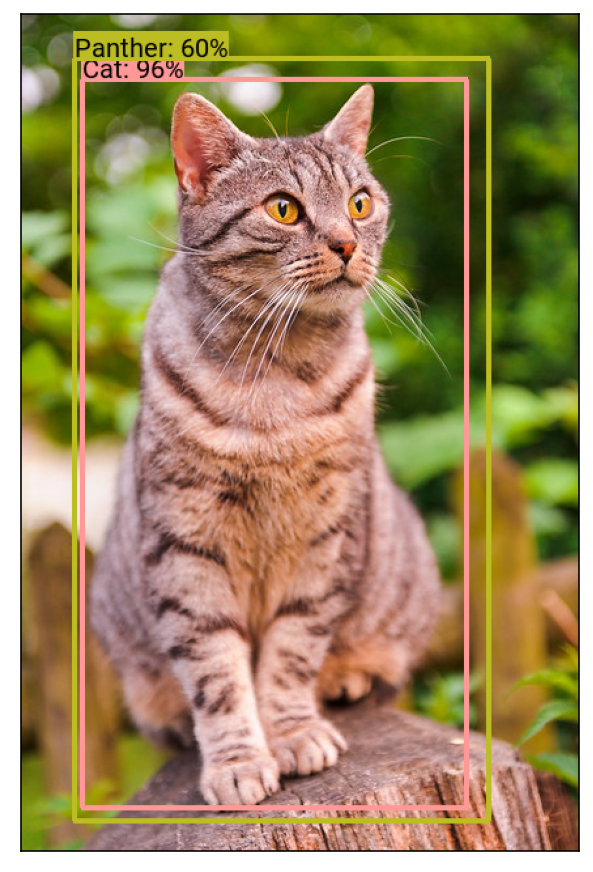

In [11]:
image, summary = detect_objects(images_raw['cat'])
plot_image(image, figsize=[5, 10])
summary

,Name,Confidence,Instances
0,Plant,99.945824,0
1,Grass,99.945824,0
2,Human,99.773537,0
3,Person,99.773537,2
4,Dog,98.987144,1
5,Animal,98.987144,0
6,Mammal,98.987144,0
7,Canine,98.987144,0
8,Pet,98.987144,0
9,Clothing,95.537170,0


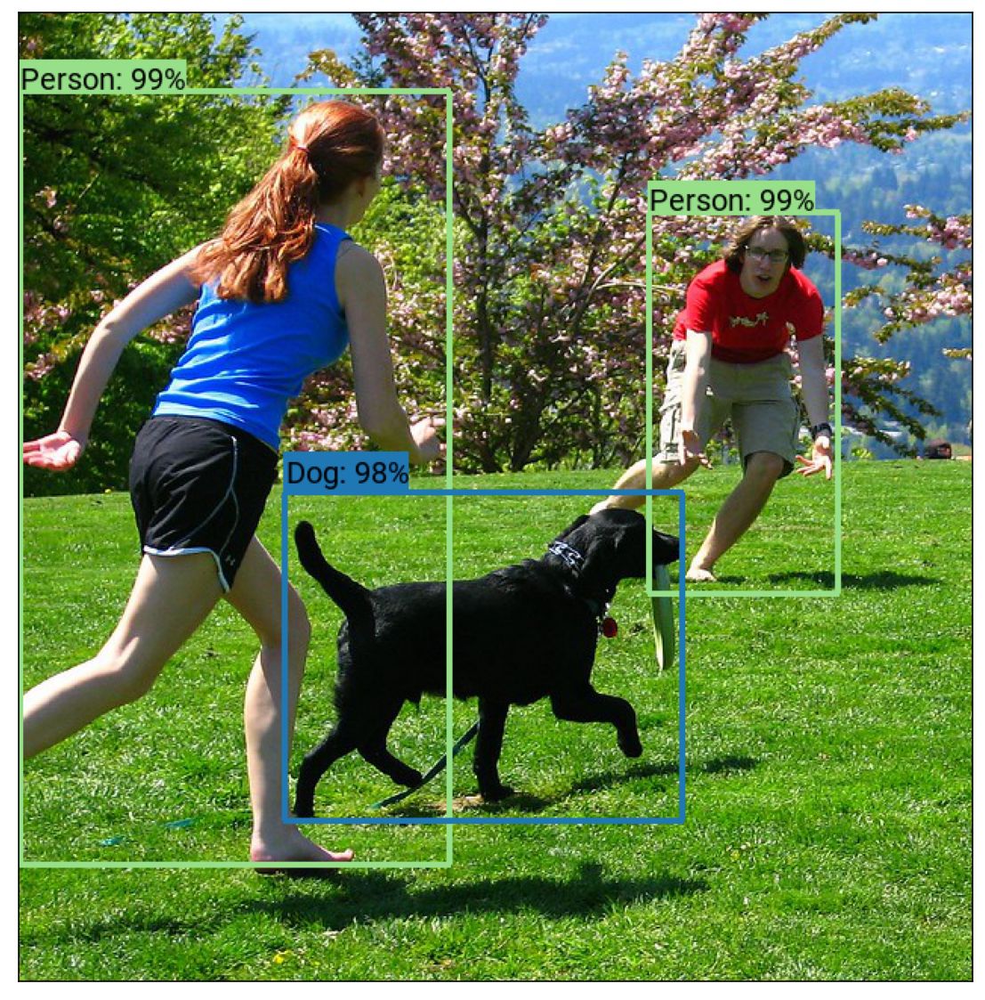

In [13]:
image, summary = detect_objects(images_raw['dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Canine,95.960449,0
1,Mammal,95.960449,0
2,Pet,95.960449,0
3,Dog,95.960449,1
4,Animal,95.960449,0
5,Vehicle,89.367638,0
6,Car,89.367638,1
7,Automobile,89.367638,0
8,Transportation,89.367638,0
9,Truck,80.327744,1


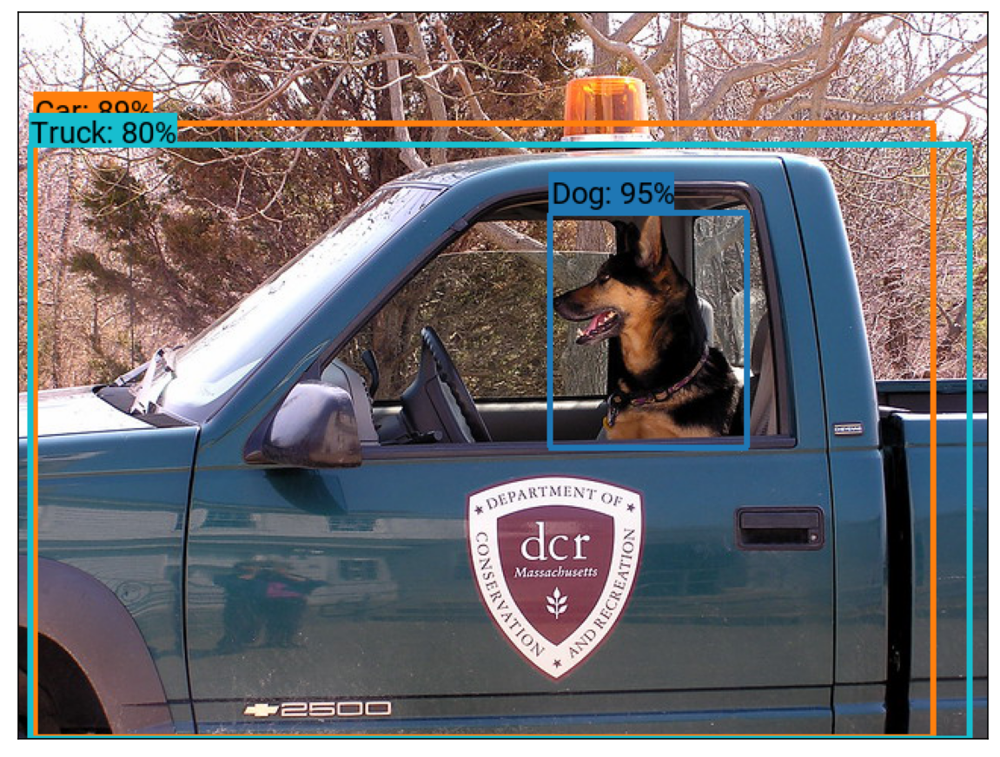

In [14]:
image, summary = detect_objects(images_raw['truck + dog'])
plot_image(image, figsize=[10, 10])
summary

,Name,Confidence,Instances
0,Animal,89.914642,0
1,Bird,89.914642,2
2,Sphere,87.092751,0
3,Nature,85.867500,0
4,Outdoors,84.801544,0
5,Sand,83.122734,0
6,Soil,82.549232,0
7,Space,76.235466,0
8,Outer Space,76.235466,0
9,Universe,76.235466,0


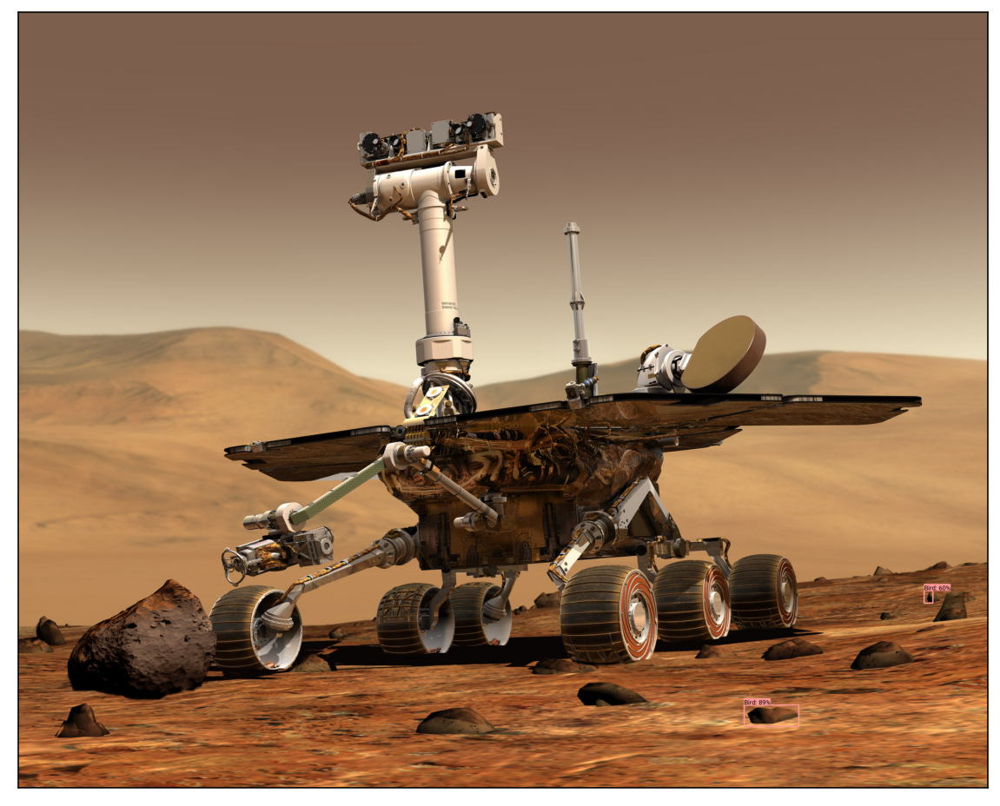

In [19]:
image, summary = detect_objects(images_raw['rover'])
plot_image(image, figsize=[10, 10])
summary